In [23]:
from IPython.display import Image

**Introduction:**

- Paper Title: Learning Transferable Visual Models from Natural Language Supervision

- Computer vision systems are trained to predict a fixed set of predetermined object categories.
    
- This restricts generality and usability as additional data is needed to learn new visual concepts.
    
- Learning about images from raw text (natural language) broadens generality and usability.

- CLIP is derived from ConVIRT (https://arxiv.org/pdf/2010.00747.pdf).
    

**Dataset:**

- Constructed a new dataset of 400 million image-text pairs called WebImageText (WIT) (https://arxiv.org/pdf/2103.01913.pdf).
    
- Collected from a variety of publicly available sources, largely Wikipedia.

- Trained on 500,000 text queries. The base query list of all words occurring at least 100 times in the english version of Wikipedia, all Wikipedia articles above a certain search volume, and all WordNet synsets. 
        
- WordNet is a lexical database of nouns, verbs, and adjectives grouped into sets of cognitive synonyms each expressing a distinct concept.

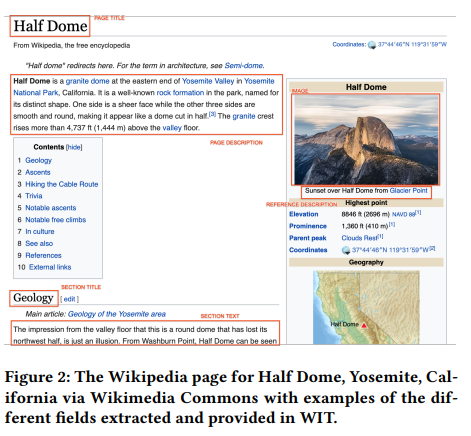

In [14]:
Image("static/pngs/clip_wit_1.PNG")

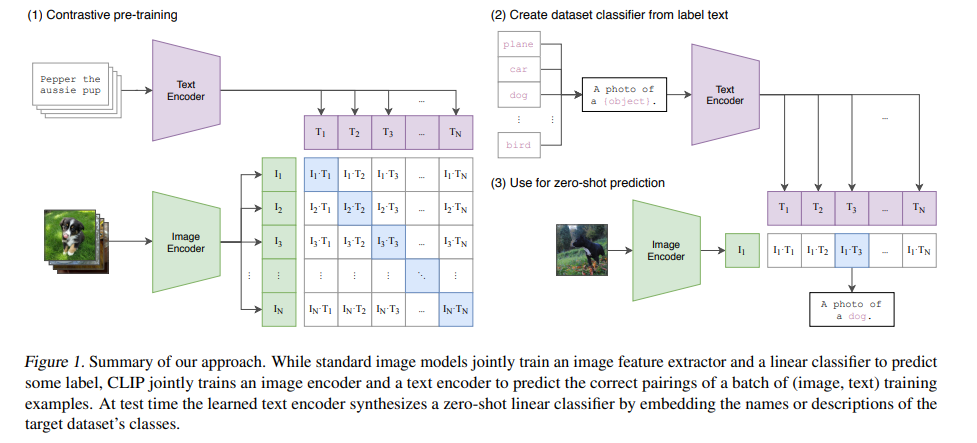

In [12]:
Image("static/pngs/clip_pipeline.PNG")

**Architecture:**

- Image Encoders:
    
    - Resnet-50-D:
        - Using the improvements of 'Making Convolutional Networks Shift-Invariant Again
' https://arxiv.org/pdf/1904.11486.pdf
        - Replace average pooling layer with attention pooling
    - Vision Transformer:
        - https://arxiv.org/pdf/2010.11929.pdf
            1. Split the image into patches
            2. Flatten the patches
            3. Produce low dimensional embeddings from patches
            4. Add positional embeddings
            5. Feed the sequence as input to a standard transformer encoder
            6. Train the model with text prompts
       
- Text Encoders:

    - Transformer
        - Operates on byte pair encoding representations
    - Contrastive Bag of Words

- Only use linear projection to map from each encoders representation to the multi-modal embedding space

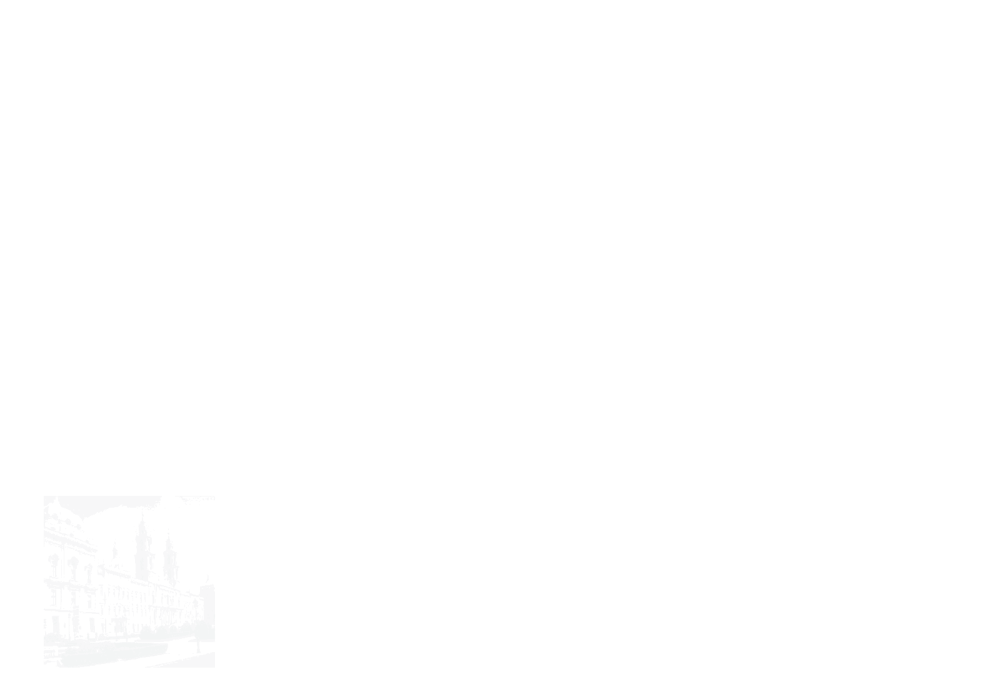

In [14]:
Image("static/pngs/vit.gif")

**Training:**
    
- Clip learns from unfiltered, highly varied, and noisy data.
    
- Contrastive learning:
        
    - technique used to learn general features of a dataset without labels by teaching the model which data points are similar or different
        
    - maximize agreement between vector representations
        
    - the model is able to distinguish between different types of images without knowing the image classes
    
    - the output of the CNN is inputted into a set of dense layers called the projection head to transform the data into another space
    
- Proxy training task: given an image, predict which out of a set of 32768 randomly sampled text snippets was actually paired with it in the dataset.
        
    - Only which text as a whole is paired with the image is important, not the exact words
    
- Given a batch of N image-text pairs, CLIP is trained to predict which the N * N possible pairings across the batch actually occurred
        
    - Thus, CLIP learns a multi-model embedding space by jointly training an image and text encoder.
        
    - Effectively, maximizing cosine similarity (agreement) between the N true pairs and N**2 - N false pairs
        
- Both image and text encoders are trained from scratch

- Trained for 32 epochs using Adam optimizer. The learning rate is decayed on a cosine schedule
    
- Trained on 256 GPUs for 2 weeks.

**Augmentations:**
    
- A random square crop from resized images is the only data augmentation used during training

**Limitations:**

- Struggles on abstract or systematic tasks such as counting the number of objects in an image
    
- Also, CLIP struggles compared to task specific models on fine-grained classification, such as telling the difference between car models or plant species
    
- Has poor generalization to images not covered in its pretraining dataset. For instance, CLIP only achieves 88% accuracy on MNIST, well below the 99.75% benchmark humans set on the dataset
    
- Trial and error 'prompt engineering' is often required to perform well

**Impacts:**

- Costly datasets: manually label datasets on a limited number of predetermined visual concepts. 

- The ImageNet dataset required over 25000 workers to annotate 14 million images of 22000 object categories. 

- In contrast, CLIP learns from text-image pairs that are already available across the internet.

In [3]:
"""
Get VIT model and vocab
"""

!mkdir -p models
!mkdir -p vocab

!wget https://openaipublic.azureedge.net/clip/models/40d365715913c9da98579312b702a82c18be219cc2a73407c4526f58eba950af/ViT-B-32.pt -O models/vit.pt
!wget https://openaipublic.azureedge.net/clip/bpe_simple_vocab_16e6.txt.gz -O bpe_simple_vocab_16e6.txt.gz -O vocab/bpe_simple_vocab_16e6.txt.gz

--2021-06-18 13:37:41--  https://openaipublic.azureedge.net/clip/models/40d365715913c9da98579312b702a82c18be219cc2a73407c4526f58eba950af/ViT-B-32.pt
Resolving openaipublic.azureedge.net (openaipublic.azureedge.net)... 13.107.213.57, 13.107.246.57, 2620:1ec:46::57, ...
Connecting to openaipublic.azureedge.net (openaipublic.azureedge.net)|13.107.213.57|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 353976522 (338M) [application/octet-stream]
Saving to: ‘models/vit.pt’

models/vit.pt       100%[===================>] 337.58M  26.0MB/s    in 15s     

2021-06-18 13:37:56 (22.7 MB/s) - ‘models/vit.pt’ saved [353976522/353976522]

--2021-06-18 13:37:57--  https://openaipublic.azureedge.net/clip/bpe_simple_vocab_16e6.txt.gz
Resolving openaipublic.azureedge.net (openaipublic.azureedge.net)... 13.107.213.57, 13.107.246.57, 2620:1ec:46::57, ...
Connecting to openaipublic.azureedge.net (openaipublic.azureedge.net)|13.107.213.57|:443... connected.
HTTP request sent, await

In [15]:
"""
Imports and load CLIP
"""
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from typing import List, Tuple
from tqdm import tqdm

from clip.zeroshot import CLIP

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

clip = CLIP(
    model_path="models/vit.pt",
    vocab_path="vocab/bpe_simple_vocab_16e6.txt.gz"
)

transform = clip.preprocess

In [16]:
"""
Load and transform coco dataset
"""

coco = "/data/datasets/coco/val2017/"
coco_images = [
    transform(Image.open(os.path.join(coco, i)))
    for i in os.listdir(coco)
]
coco_image_features = clip.encode_images(coco_images)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


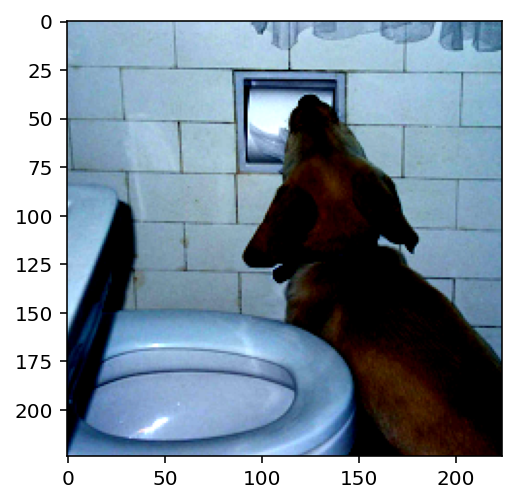

In [17]:
"""
Replicate pipeline example above.
"""
description = "show me a dog"
text_feature = clip.encode_texts([description])
idx = np.argmax(coco_image_features @ text_feature.T, axis=0)[0]
highest_similarity_image_tensor = coco_images[idx]
plt.imshow(highest_similarity_image_tensor.permute(1, 2, 0))

In [18]:
"""
Verify CLIP accuracy on CIFAR10

Reported test accuracy is 87% without any additional finetuning, completely zero-shot 
and out of the box. Similiar to purpose trained ResNet20v1 without batch norm.
"""

from torchvision.datasets import CIFAR10
from torch.utils.data import DataLoader
from torchvision.transforms import Compose, ToTensor

cifar10 = CIFAR10(os.path.expanduser("~/.cache"), download=True, transform=transform)
cifar_classes = cifar10.classes

d = DataLoader(cifar10, batch_size=1, shuffle=True)

def classify_images(dataloader: torch.utils.data.DataLoader, labels: List[str], bound: int = -1):
    """
    Use zero-shot capabilities to classify images,
    and determine accuracy.
    
    Parameters:
    -----------
    dataloader: torch.utils.data.Dataloader
    labels: List[str]
    bound: int
        Number of iterations of the dataloader 
        before exiting.
    
    Returns:
    --------
    accuracy: float[0,1]
    """
    tp = 0
    for i, (img, label_index) in tqdm(enumerate(dataloader)):
        image_features = clip.encode_images(img)
        text_features = clip.encode_texts(labels)
        text_probabilities = clip.similarity(image_features, text_features, return_probabilities=True)
        predicted_label = cifar_classes[np.argmax(text_probabilities)]
        if labels[label_index] == predicted_label:
            tp += 1
        acc = tp / (i + 1)
        if i == bound:
            break
    return acc
        
acc = classify_images(d, cifar_classes, 250)
print(f"accuracy: {acc}")

Files already downloaded and verified


250it [00:27,  9.16it/s]

accuracy: 0.896414342629482


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


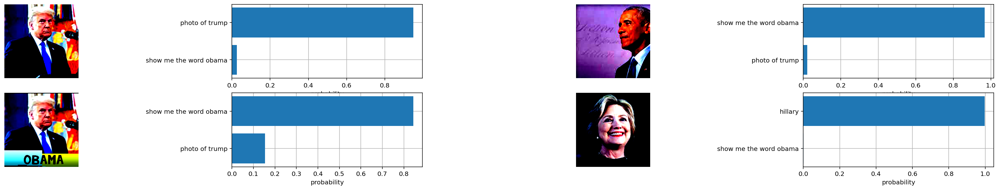

In [19]:
"""
Similar to iPod attack (https://openai.com/blog/multimodal-neurons/#attacksinthewild)
"""
root = "static/images"
inject = lambda prefix, label, suffix: f"{prefix} {label} {suffix}"
transformed_images = [
    transform(Image.open(os.path.join(root, i)))
    for i in os.listdir(root)
]
descriptions = ["male wearing a tie", "show me the word obama", "photo of trump", "hillary"]

def topk(images: List[torch.tensor], texts: List[str], topk: int) -> Tuple[torch.tensor, torch.tensor]:
    """
    Compute the highest probability text classes/descriptions for
    each image.
    
    Parameters:
    -----------
    images: List[torch.tensor]
    texts: List[str]
    
    Returns:
    --------
    top_probs, top_labels: Tuple[torch.tensor, torch.tensor]
    """
    image_features = clip.encode_images(images)
    text_features = clip.encode_texts(texts)
    text_probabilities = clip.similarity(image_features, text_features, return_probabilities=True)
    top_probs, top_labels = torch.tensor(text_probabilities).topk(topk, dim=-1)
    return top_probs, top_labels

def topk_plotting(images: List[torch.tensor], classes: List[str], topk_probs: torch.tensor, topk_labels: torch.tensor):
    """
    Plot the highest probability text classes/descriptions for
    each image.
    
    Parameters:
    -----------
    images: List[torch.tensor]
    classes: List[str]
    topk_probs: torch.tensor
    topk_labels: torch.tensor
    
    Returns:
    --------
    plot: plt
    """
    n, s = len(images), 4
    plt.figure(figsize=(30, 10))
    for i, image in enumerate(images):
        plt.subplot(s, s, 2 * i + 1)
        plt.imshow(image.permute(1, 2, 0))
        plt.axis("off")
        plt.subplot(4, 4, 2 * i + 2)
        y = np.arange(topk_probs.shape[-1])
        plt.grid()
        plt.barh(y, topk_probs[i])
        plt.gca().invert_yaxis()
        plt.gca().set_axisbelow(True)
        plt.yticks(y, [classes[index] for index in topk_labels[i].numpy()])
        plt.xlabel("probability")
    plt.subplots_adjust(wspace=0.5)
    plt.show()

top_probs, top_labels = topk(transformed_images, descriptions, topk=2)
topk_plotting(transformed_images, descriptions, top_probs, top_labels)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


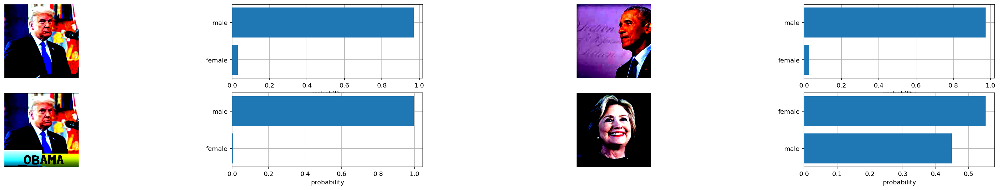

In [20]:
descriptions = ["male", "female"]

top_probs, top_labels = topk(transformed_images, descriptions, topk=2)
topk_plotting(transformed_images, descriptions, top_probs, top_labels)

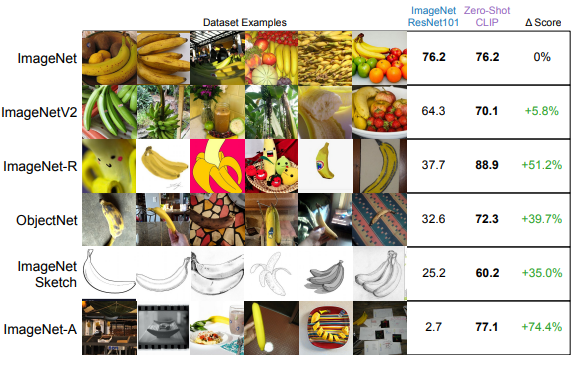

In [24]:
"""
More robust to distribution shift than standard ImageNet models.

Discover that the highest layers of CLIP organize images as a loose semantic collection of ideas.
"""
Image("static/pngs/clip_robustness.PNG")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


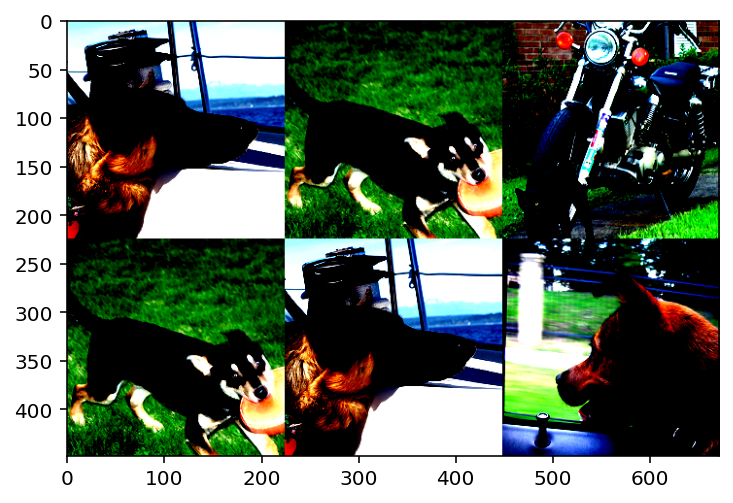

In [25]:
"""
Just using the default prompt "A photo of a {label}" improves accuracy of Imagenet by 1.3%.

Also, helps to specify the category of the label. 
For example, "A photo of a {label}, a type of pet" if the dataset is Oxford Pets.
"""

plain_description = "german shepherd"
contexted_description = "a photo of a german shepherd, a type of dog"

def stack(text_features, image_features, images):
    x = clip.top(text_features, image_features, images, topk=3)
    ts = [i[1] for i in x]
    t = torch.cat(ts, dim=2)
    return t

texts = [plain_description]
coco_plain_text_features = clip.encode_texts(texts)
a = stack(coco_plain_text_features, coco_image_features, coco_images)

texts = [contexted_description]
coco_contexted_text_features = clip.encode_texts(texts)
b = stack(coco_contexted_text_features, coco_image_features, coco_images)

joined = torch.cat((a,b), dim=1)

plt.imshow(joined.permute(1, 2, 0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


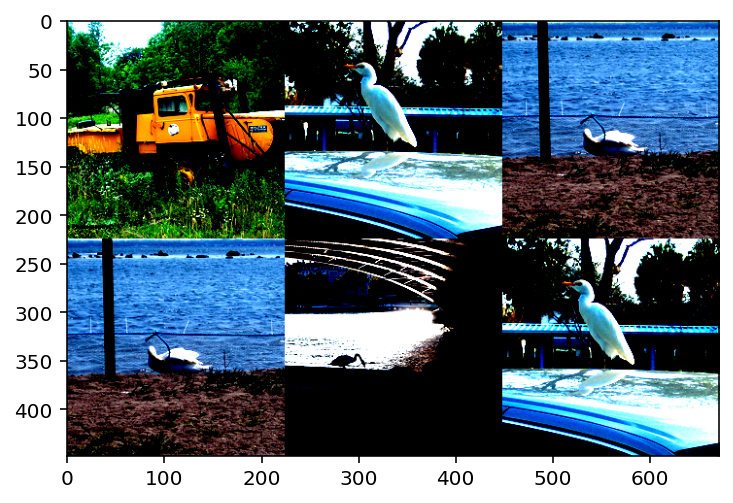

In [26]:
"""
Lack of context related to the work itself.
"""

lack_of_context_text = "show me a crane"
more_context_text = "show me a crane, by the water"

texts = [lack_of_context_text]
coco_lack_of_context_text_features = clip.encode_texts(texts)
a = stack(coco_lack_of_context_text_features, coco_image_features, coco_images)

texts = [more_context_text]
coco_more_context_text_features = clip.encode_texts(texts)
b = stack(coco_more_context_text_features, coco_image_features, coco_images)

joined = torch.cat((a,b), dim=1)

plt.imshow(joined.permute(1, 2, 0))

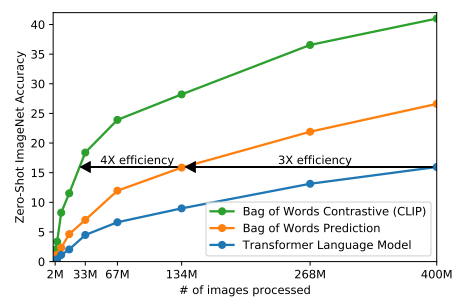

In [27]:
"""
CLIP is much more efficient at zero-shot transfer using a bag-of-words encoding of text.

A 63 million parameter transformer language model, which already uses twice the compute
of its ResNet-50 image encoder, learns to recognize ImageNet classes three times
slower than a much simpler baseline that predicts a bag-of-words encoding of the same text.
"""

Image("static/pngs/clip_efficiency.PNG")

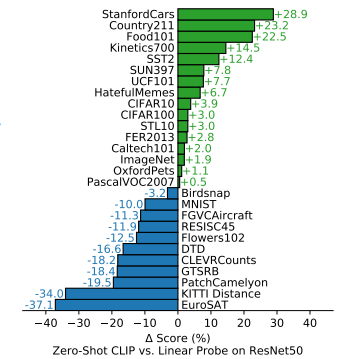

In [28]:
"""
CLIP's features outperform the features of the best ImageNet model on 21 out 27 datasets. This
comparison was completed against the Noisy Student EfficientNet-L2 which required 33 TPU years to train.
"""

Image("static/pngs/clip_performance.PNG")

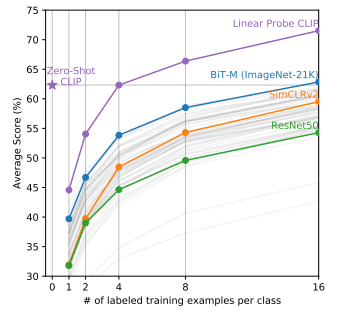

In [29]:
"""
Zero-shot CLIP outperforms few-shot linear probes. It matches the average performance
of a 4-shot linear classifier trained on the same feature space.
"""

Image("static/pngs/clip_differentiability.PNG")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


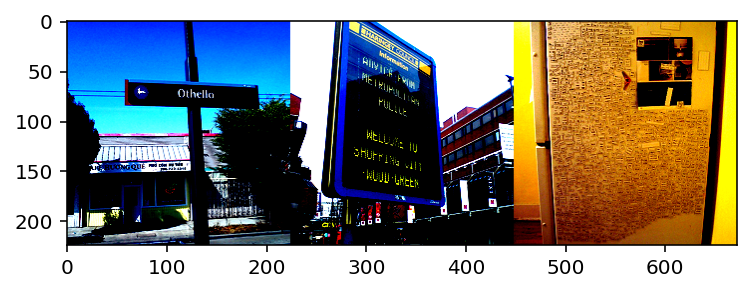

In [30]:
"""
For OCR tasks putting quotes around the number or character improved performance.
"""
ocr_text = "display the word 'HELLO'"
texts = [ocr_text]
coco_ocr_text = clip.encode_texts(texts)
a = stack(coco_ocr_text, coco_image_features, coco_images)
plt.imshow(a.permute(1, 2, 0))